In [1]:
import os
import time
import shutil
import pathlib
import itertools

import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD  
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout, Activation, SeparableConv2D, GlobalAveragePooling2D

import warnings
warnings.filterwarnings("ignore")

print('Modules loaded')

Modules loaded


In [2]:
dataset_path = "H:/MangoBD"

filepaths = []
labels = []

for class_name in os.listdir(dataset_path):
    class_path = os.path.join(dataset_path, class_name)
    if os.path.isdir(class_path):
        for file_name in os.listdir(class_path):
            file_path = os.path.join(class_path, file_name)
            filepaths.append(file_path)
            labels.append(class_name)

df = pd.DataFrame({'filepaths': filepaths, 'labels': labels})

#80%, 10%, 10% Split
train_df, test_df = train_test_split(df, test_size=0.2, random_state=42)
valid_df, test_df = train_test_split(test_df, test_size=0.5, random_state=42)

#Data augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.densenet.preprocess_input,
    horizontal_flip=True,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    zoom_range=0.1
)

#Normalization
valid_test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.densenet.preprocess_input
)

batch_size = 12

train_gen = train_datagen.flow_from_dataframe(
    train_df,
    x_col='filepaths',
    y_col='labels',
    target_size=(227, 227),  
    batch_size=batch_size,
    class_mode='categorical'
)

valid_gen = valid_test_datagen.flow_from_dataframe(
    valid_df,
    x_col='filepaths',
    y_col='labels',
    target_size=(227, 227),  
    batch_size=batch_size,
    class_mode='categorical'
)

test_gen = valid_test_datagen.flow_from_dataframe(
    test_df,
    x_col='filepaths',
    y_col='labels',
    target_size=(227, 227), 
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)


Found 3200 validated image filenames belonging to 8 classes.
Found 400 validated image filenames belonging to 8 classes.
Found 400 validated image filenames belonging to 8 classes.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

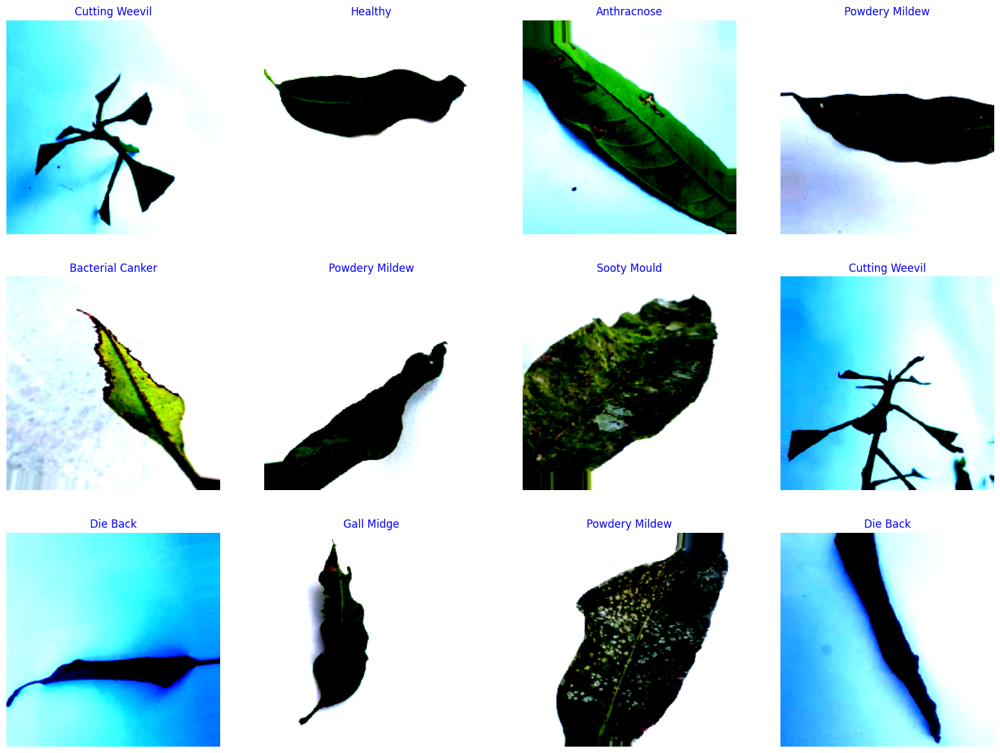

In [3]:
g_dict = train_gen.class_indices
classes = list(g_dict.keys())
images, labels = next(train_gen)

plt.figure(figsize=(20, 20))

batch_size = len(images) 

for i in range(batch_size):
    plt.subplot(4, 4, i + 1)
    image = images[i]  
    plt.imshow(image)
    index = np.argmax(labels[i])
    class_name = classes[index]
    plt.title(class_name, color='blue', fontsize=12)
    plt.axis('off')

plt.show()

In [4]:
model = Sequential()

#Convolutional layer 2
model.add(Conv2D(64, (7, 7), strides=(2, 2), input_shape=(227, 227, 3)))  
model.add(BatchNormalization())
model.add(Activation('relu'))

#Convolutional layer 2
model.add(Conv2D(128, (5, 5), strides=(1, 1)))
model.add(BatchNormalization())
model.add(Activation('relu'))

#MaxPooling layer 1
model.add(MaxPooling2D(pool_size=(3, 3), strides=(2, 2)))

#Convolutional layer 3
model.add(Conv2D(256, (3, 3), strides=(1, 1)))
model.add(BatchNormalization())
model.add(Activation('relu'))

# Convolutional layer 4
model.add(Conv2D(128, (3, 3), strides=(1, 1)))
model.add(BatchNormalization())
model.add(Activation('relu'))

# MaxPooling layer 2
model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))

#Global Average Pooling
model.add(GlobalAveragePooling2D())

#Fully connected layer 1
model.add(Dense(128))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.3)) 

#Fully connected layer 2
model.add(Dense(8, activation='softmax'))

custom_learning_rate = 0.001  

custom_optimizer = SGD(learning_rate=custom_learning_rate)

model.compile(optimizer=custom_optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 111, 111, 64)      9472      
                                                                 
 batch_normalization (BatchN  (None, 111, 111, 64)     256       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 111, 111, 64)      0         
                                                                 
 conv2d_1 (Conv2D)           (None, 107, 107, 128)     204928    
                                                                 
 batch_normalization_1 (Batc  (None, 107, 107, 128)    512       
 hNormalization)                                                 
                                                                 
 activation_1 (Activation)   (None, 107, 107, 128)     0

In [5]:
epochs = 100  
history = model.fit(
    train_gen,
    steps_per_epoch=len(train_gen),
    validation_data=valid_gen,
    validation_steps=len(valid_gen),
    epochs=epochs
)

Epoch 1/100
267/267 [==============================] - 65s 214ms/step - loss: 1.0253 - accuracy: 0.6591 - val_loss: 1.3786 - val_accuracy: 0.5825
Epoch 2/100
267/267 [==============================] - 27s 100ms/step - loss: 0.6336 - accuracy: 0.8131 - val_loss: 0.5601 - val_accuracy: 0.8200
Epoch 3/100
267/267 [==============================] - 28s 106ms/step - loss: 0.5219 - accuracy: 0.8475 - val_loss: 0.3940 - val_accuracy: 0.8825
Epoch 4/100
267/267 [==============================] - 27s 102ms/step - loss: 0.4281 - accuracy: 0.8828 - val_loss: 0.3562 - val_accuracy: 0.8825
Epoch 5/100
267/267 [==============================] - 27s 99ms/step - loss: 0.3973 - accuracy: 0.8903 - val_loss: 0.4375 - val_accuracy: 0.8650
Epoch 6/100
267/267 [==============================] - 26s 98ms/step - loss: 0.3831 - accuracy: 0.8878 - val_loss: 0.2624 - val_accuracy: 0.9450
Epoch 7/100
267/267 [==============================] - 27s 101ms/step - loss: 0.3590 - accuracy: 0.9009 - val_loss: 0.2832 - v

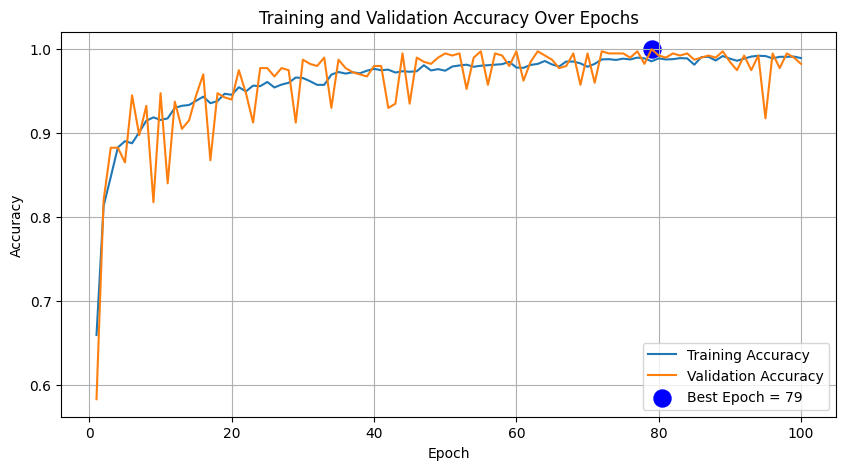

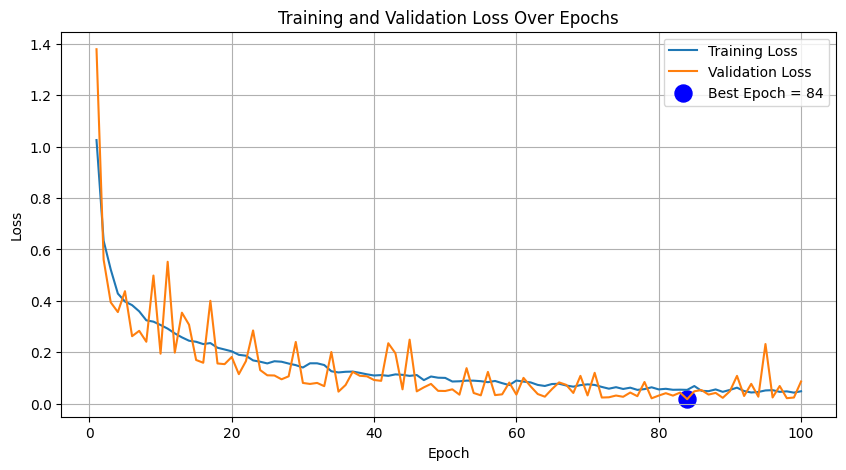

In [6]:
import os
import matplotlib.pyplot as plt

tr_loss = history.history['loss']
tr_acc = history.history['accuracy']
val_loss = history.history['val_loss']
val_acc = history.history['val_accuracy']

index_loss = np.argmin(val_loss)
val_lowest = val_loss[index_loss]
index_acc = np.argmax(val_acc)
acc_highest = val_acc[index_acc]

epochs = range(1, len(tr_loss) + 1)
loss_label = f'Best Epoch = {index_loss + 1}'
acc_label = f'Best Epoch = {index_acc + 1}'

#accuracy
plt.figure(figsize=(10, 5))
plt.plot(epochs, tr_acc, label='Training Accuracy', linestyle='-')
plt.plot(epochs, val_acc, label='Validation Accuracy', linestyle='-')
plt.scatter(index_acc + 1, acc_highest, s=150, c='blue', label=acc_label)
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy Over Epochs')
plt.grid(True)
plt.show()

#loss
plt.figure(figsize=(10, 5))
plt.plot(epochs, tr_loss, label='Training Loss', linestyle='-')
plt.plot(epochs, val_loss, label='Validation Loss', linestyle='-')
plt.scatter(index_loss + 1, val_lowest, s=150, c='blue', label=loss_label)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss Over Epochs')
plt.grid(True)
plt.show()


In [7]:
ts_length = len(test_df)
test_batch_size = max(sorted([ts_length // n for n in range(1, ts_length + 1) if ts_length%n == 0 and ts_length/n <= 80]))
test_steps = ts_length // test_batch_size

train_score = model.evaluate(train_gen, steps= test_steps, verbose= 1)
valid_score = model.evaluate(valid_gen, steps= test_steps, verbose= 1)
test_score = model.evaluate(test_gen, steps= test_steps, verbose= 1)

print("Train Loss: ", train_score[0])
print("Train Accuracy: ", train_score[1])
print('-' * 20)
print("Validation Loss: ", valid_score[0])
print("Validation Accuracy: ", valid_score[1])
print('-' * 20)
print("Test Loss: ", test_score[0])
print("Test Accuracy: ", test_score[1])

5/5 [==============================] - 1s 138ms/step - loss: 0.0502 - accuracy: 1.0000
Train Loss:  0.049882922321558
Train Accuracy:  1.0
--------------------
Validation Loss:  0.08755271881818771
Validation Accuracy:  0.9833333492279053
--------------------
Test Loss:  0.0501868799328804
Test Accuracy:  1.0


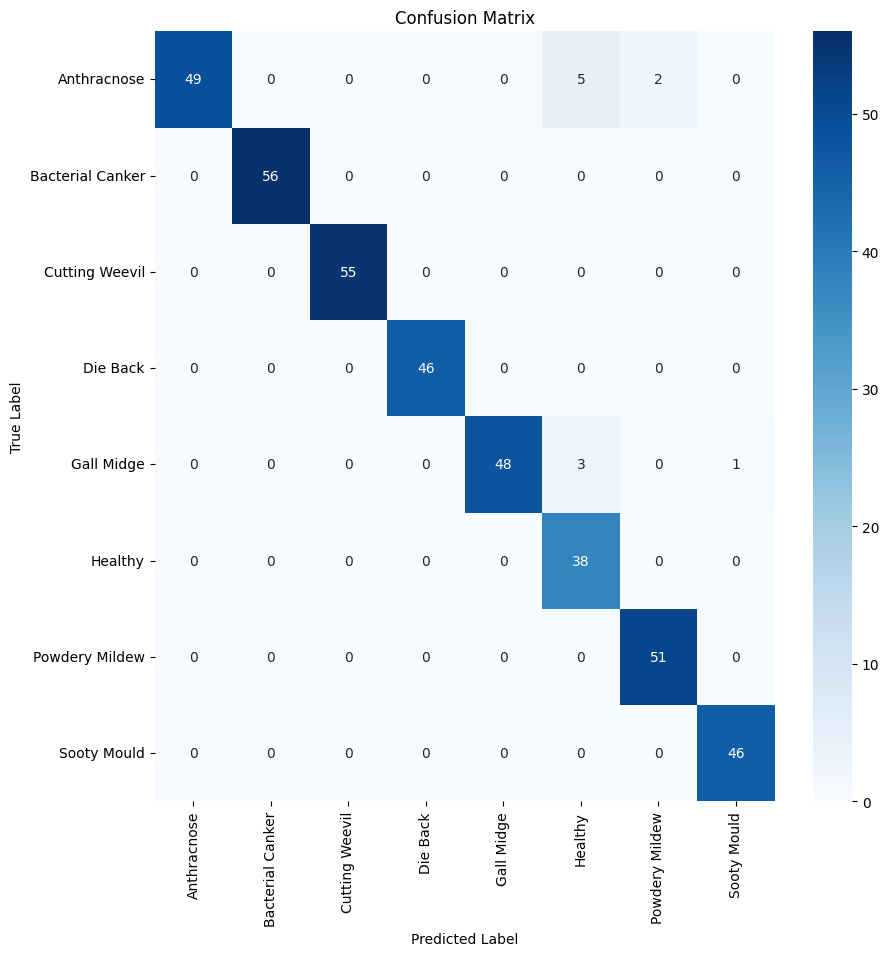

In [8]:
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)
g_dict = test_gen.class_indices
classes = list(g_dict.keys())

# Confusion matrix
cm = confusion_matrix(test_gen.classes, y_pred)

plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')

plt.show()

In [9]:
# Classification report
print(classification_report(test_gen.classes, y_pred, target_names= classes))

                  precision    recall  f1-score   support

     Anthracnose       1.00      0.88      0.93        56
Bacterial Canker       1.00      1.00      1.00        56
  Cutting Weevil       1.00      1.00      1.00        55
        Die Back       1.00      1.00      1.00        46
      Gall Midge       1.00      0.92      0.96        52
         Healthy       0.83      1.00      0.90        38
  Powdery Mildew       0.96      1.00      0.98        51
     Sooty Mould       0.98      1.00      0.99        46

        accuracy                           0.97       400
       macro avg       0.97      0.97      0.97       400
    weighted avg       0.98      0.97      0.97       400



34/34 [==============================] - 1s 24ms/step
Class 0 - AUC: 1.00
Class 1 - AUC: 1.00
Class 2 - AUC: 1.00
Class 3 - AUC: 1.00
Class 4 - AUC: 1.00
Class 5 - AUC: 1.00
Class 6 - AUC: 1.00
Class 7 - AUC: 1.00


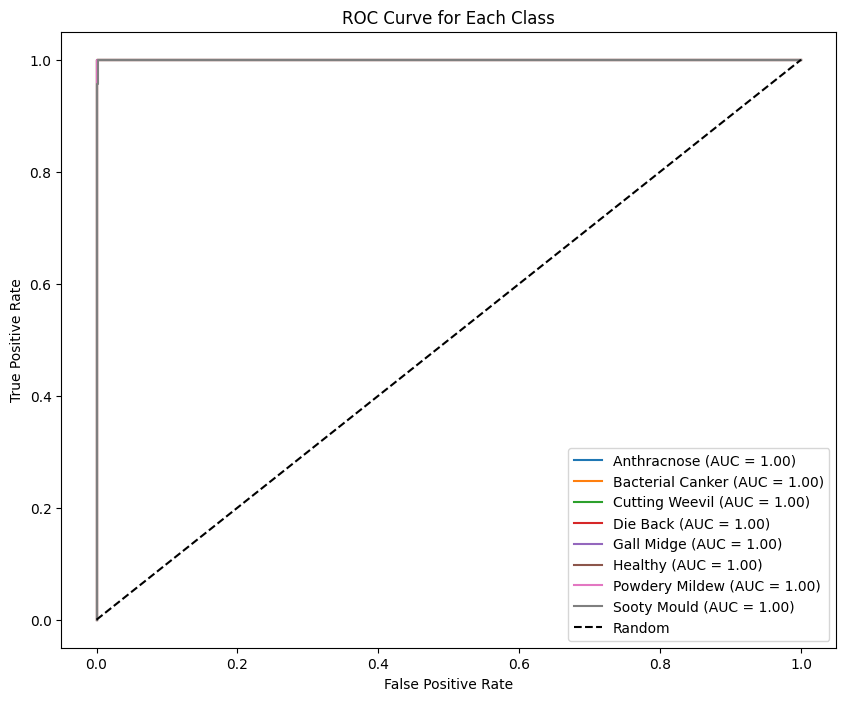

In [10]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc

#Number of classes
num_classes = len(train_gen.class_indices)

#Prediction generation
y_pred_prob = model.predict_generator(test_gen, steps=len(test_gen), verbose=1)

#One-hot encoding conversion
y_true = label_binarize(test_gen.classes, classes=range(num_classes))

#ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true[:, i], y_pred_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    print(f'Class {i} - AUC: {roc_auc[i]:.2f}')

#ROC curve fig
plt.figure(figsize=(10, 8))

for i in range(num_classes):
    plt.plot(fpr[i], tpr[i], label=f'{classes[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', label='Random')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Each Class')
plt.legend(loc='lower right')
plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

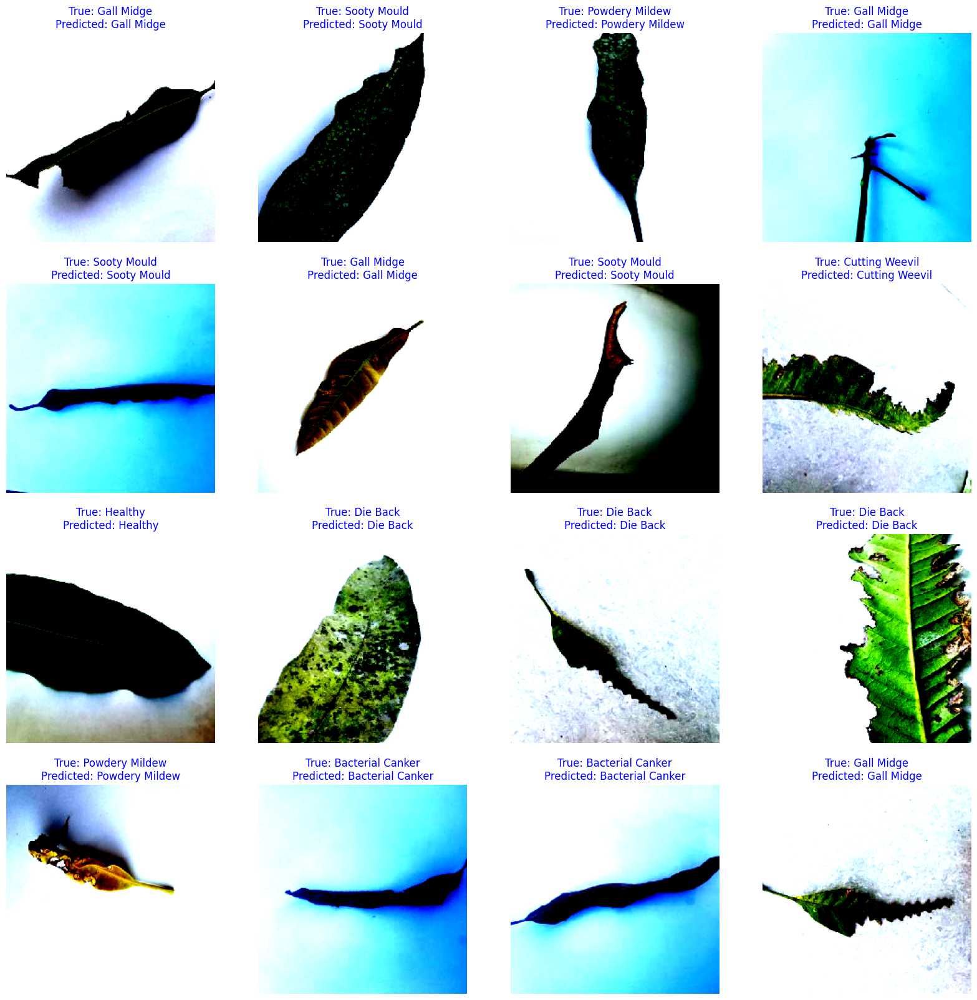

In [11]:
#Prediction generation
preds = model.predict_generator(test_gen)
y_pred = np.argmax(preds, axis=1)

#True labels
true_labels = test_gen.classes

#Image display
plt.figure(figsize=(20, 20))

for i in range(16):  
    plt.subplot(4, 4, i + 1)
    image = test_gen[i][0][0]  
    true_label = classes[true_labels[i]]
    pred_label = classes[y_pred[i]]

    plt.imshow(image)
    plt.title(f'True: {true_label}\nPredicted: {pred_label}', color='blue', fontsize=12)
    plt.axis('off')

plt.show()


In [12]:
import os
import time
import shutil
import pathlib
import itertools

import cv2
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import SGD  
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, BatchNormalization, MaxPooling2D, Flatten, Dense, Dropout, Activation, SeparableConv2D, GlobalAveragePooling2D
from tensorflow.keras import backend as K

import warnings
warnings.filterwarnings("ignore")

print('Modules loaded')

Modules loaded


In [20]:
def display_saliency_map(img_path, saliency):
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)
    saliency = tf.maximum(saliency, 0)  # ReLU to remove negative values
    saliency = saliency / tf.reduce_max(saliency)  # Normalize to [0, 1]
    
    #Display saliency map 
    plt.figure(figsize=(5, 5))
    plt.imshow(saliency.numpy(), cmap='jet')
    plt.axis('off')
    plt.title('Saliency Map')
    plt.show()
    
    #Overlay saliency map 
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img.astype(np.uint8))
    plt.axis('off')
    plt.title('Original Image')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img.astype(np.uint8))
    plt.imshow(saliency.numpy(), cmap='jet', alpha=0.5)
    plt.axis('off')
    plt.title('Overlayed Saliency Map')
    plt.show()


In [23]:
def compute_saliency_map(model, img_array, class_index):
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        loss = preds[:, class_index]
    grads = tape.gradient(loss, img_tensor)
    
    print(f"Gradient min: {tf.reduce_min(grads).numpy()}, max: {tf.reduce_max(grads).numpy()}")
    
    return grads

img_path = test_gen.filepaths[0]
img_array = get_img_array(img_path, size=(227, 227))
preds = model.predict(img_array)
class_index = np.argmax(preds[0])

#Predicted class
print(f'Predicted class index: {class_index}, Predicted class label: {classes[class_index]}')

grads = compute_saliency_map(model, img_array, class_index)

#Gradient values
print(f'Gradient values range: {tf.reduce_min(grads).numpy()} to {tf.reduce_max(grads).numpy()}')


1/1 [==============================] - 0s 19ms/step
Predicted class index: 2, Predicted class label: Cutting Weevil
Gradient min: 0.0, max: 0.0
Gradient values range: 0.0 to 0.0


In [24]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

def compute_and_print_gradients(model, img_array, class_index):
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        loss = preds[:, class_index]
    grads = tape.gradient(loss, img_tensor)
    
    print(f"Gradient min: {tf.reduce_min(grads).numpy()}, max: {tf.reduce_max(grads).numpy()}")
    return grads

#Load image
img_path = test_gen.filepaths[0]
img_array = get_img_array(img_path, size=(227, 227))
preds = model.predict(img_array)
class_index = np.argmax(preds[0])

#Predicted class
print(f'Predicted class index: {class_index}, Predicted class label: {classes[class_index]}')

#Gradients
grads = compute_and_print_gradients(model, img_array, class_index)

#Gradient values
print(f'Gradient values range: {tf.reduce_min(grads).numpy()} to {tf.reduce_max(grads).numpy()}')


1/1 [==============================] - 0s 18ms/step
Predicted class index: 2, Predicted class label: Cutting Weevil
Gradient min: 0.0, max: 0.0
Gradient values range: 0.0 to 0.0


In [25]:
def preprocess_input(image):
    return tf.keras.applications.densenet.preprocess_input(image)

def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return preprocess_input(array)


In [26]:
img_path = test_gen.filepaths[0]
img_array = get_img_array(img_path, size=(227, 227))
preds = model.predict(img_array)

#Predicted class
class_index = np.argmax(preds[0])
print(f'Predicted class index: {class_index}, Predicted class label: {classes[class_index]}')

#Prediction values
print(f'Prediction values: {preds[0]}')


1/1 [==============================] - 0s 18ms/step
Predicted class index: 4, Predicted class label: Gall Midge
Prediction values: [5.9913145e-04 2.1254905e-02 1.1040811e-02 3.1981084e-03 6.6516888e-01
 3.2630801e-02 2.6212385e-01 3.9834706e-03]


In [27]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

#Preprocessing function
def preprocess_input(image):
    return tf.keras.applications.densenet.preprocess_input(image)

#Image array with preprocessing
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return preprocess_input(array)

#Simplified gradient computation
def compute_and_print_gradients(model, img_array, class_index):
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        loss = preds[:, class_index]
    grads = tape.gradient(loss, img_tensor)
    
    print(f"Gradient min: {tf.reduce_min(grads).numpy()}, max: {tf.reduce_max(grads).numpy()}")
    return grads

#Sample image
img_path = test_gen.filepaths[0]
img_array = get_img_array(img_path, size=(227, 227))
preds = model.predict(img_array)

#Predicted class
class_index = np.argmax(preds[0])
print(f'Predicted class index: {class_index}, Predicted class label: {classes[class_index]}')

#Prediction values
print(f'Prediction values: {preds[0]}')

#Compute gradients
grads = compute_and_print_gradients(model, img_array, class_index)

#Gradient values
print(f'Gradient values range: {tf.reduce_min(grads).numpy()} to {tf.reduce_max(grads).numpy()}')


1/1 [==============================] - 0s 26ms/step
Predicted class index: 4, Predicted class label: Gall Midge
Prediction values: [5.9913145e-04 2.1254905e-02 1.1040811e-02 3.1981084e-03 6.6516888e-01
 3.2630801e-02 2.6212385e-01 3.9834706e-03]
Gradient min: -0.008027258329093456, max: 0.00824420340359211
Gradient values range: -0.008027258329093456 to 0.00824420340359211


In [28]:
def compute_saliency_map(model, img_array, class_index):
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        loss = preds[:, class_index]
    grads = tape.gradient(loss, img_tensor)
    
    saliency = tf.reduce_max(tf.abs(grads), axis=-1)
    
    return saliency[0].numpy()

#Display and Save Saliency Maps
def display_saliency_maps(img_path, saliency, save_path, alpha=0.4):
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)
    
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()
    
    plt.figure(figsize=(20, 5))
    
    #Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(img.astype(np.uint8))
    plt.title("Original Image")
    plt.axis('off')
    
    #Saliency Map
    plt.subplot(1, 3, 2)
    plt.imshow(saliency, cmap='jet')
    plt.title("Saliency Map")
    plt.axis('off')
    
    #Overlayed Saliency Map
    plt.subplot(1, 3, 3)
    plt.imshow(img.astype(np.uint8))
    plt.imshow(saliency, cmap='jet', alpha=alpha)
    plt.title("Overlayed Saliency Map")
    plt.axis('off')
    
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()

1/1 [==============================] - 0s 18ms/step
Predicted class index: 4, Predicted class label: Gall Midge
Saliency map (gradient) values range: 0.0 to 0.00824420340359211


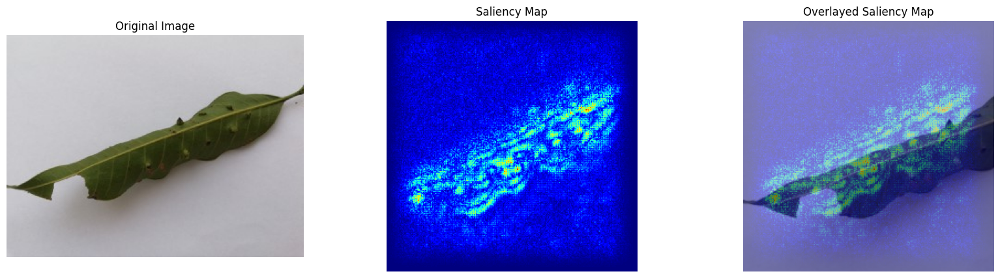

1/1 [==============================] - 0s 19ms/step
Predicted class index: 7, Predicted class label: Sooty Mould
Saliency map (gradient) values range: 0.0 to 0.0008982032304629683


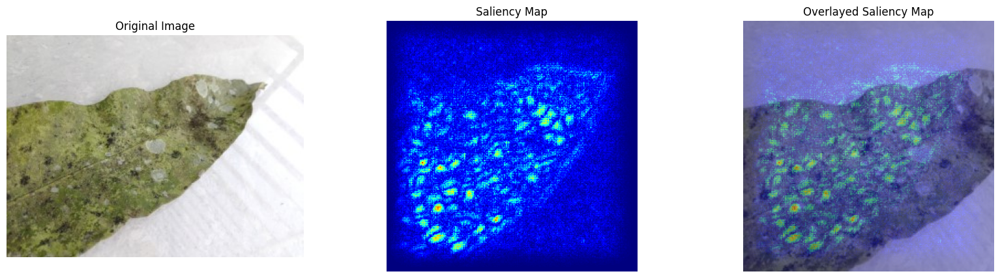

1/1 [==============================] - 0s 19ms/step
Predicted class index: 6, Predicted class label: Powdery Mildew
Saliency map (gradient) values range: 0.0 to 1.9910488845198415e-05


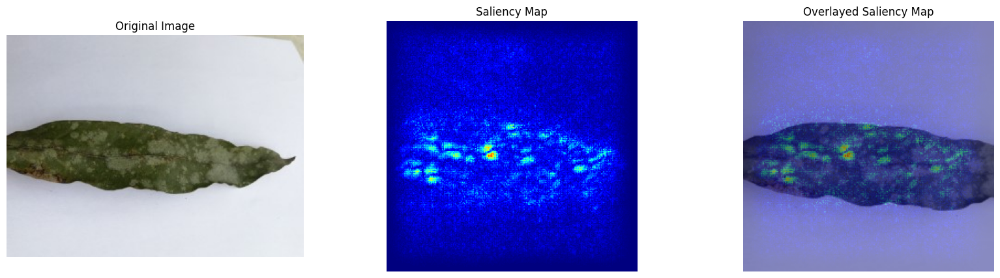

1/1 [==============================] - 0s 19ms/step
Predicted class index: 4, Predicted class label: Gall Midge
Saliency map (gradient) values range: 0.0 to 3.733531411853619e-05


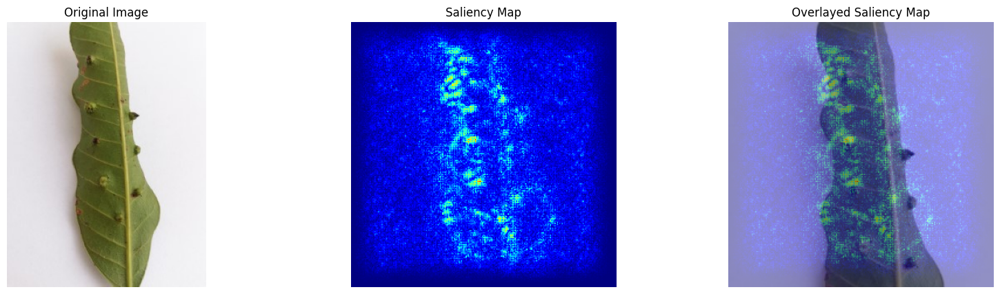

1/1 [==============================] - 0s 19ms/step
Predicted class index: 7, Predicted class label: Sooty Mould
Saliency map (gradient) values range: 0.0 to 0.0003553556161932647


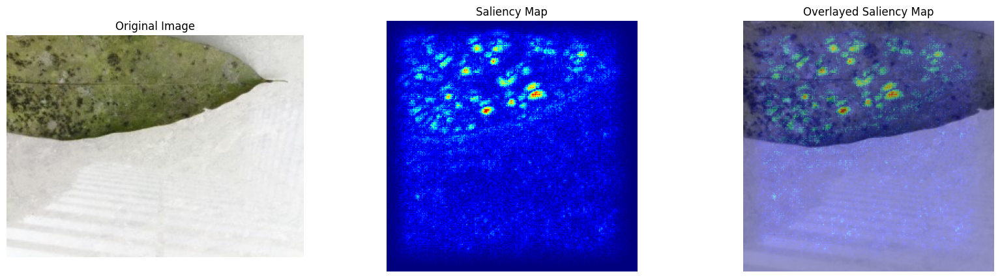

In [29]:
for idx, img_path in enumerate(test_gen.filepaths[:5]):
    img_array = get_img_array(img_path, size=(227, 227))
    preds = model.predict(img_array)
    class_index = np.argmax(preds[0])
    
    #Predicted class
    print(f'Predicted class index: {class_index}, Predicted class label: {classes[class_index]}')
    
    saliency = compute_saliency_map(model, img_array, class_index)
    
    #Gradient values
    print(f'Saliency map (gradient) values range: {saliency.min()} to {saliency.max()}')
    
    #Save path
    save_path = f"H:/LC25000/Trained Image/PlantLeafNetSaliency_{idx+1}.pdf"
    
    #Display
    display_saliency_maps(img_path, saliency, save_path)

1/1 [==============================] - 0s 22ms/step
Predicted class index: 4, Predicted class label: Gall Midge
Saliency map (gradient) values range: 0.0 to 0.00824420340359211


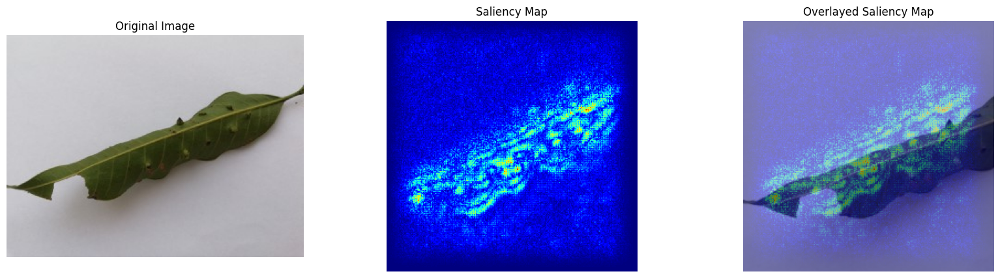

1/1 [==============================] - 0s 32ms/step
Predicted class index: 7, Predicted class label: Sooty Mould
Saliency map (gradient) values range: 0.0 to 0.0008982032304629683


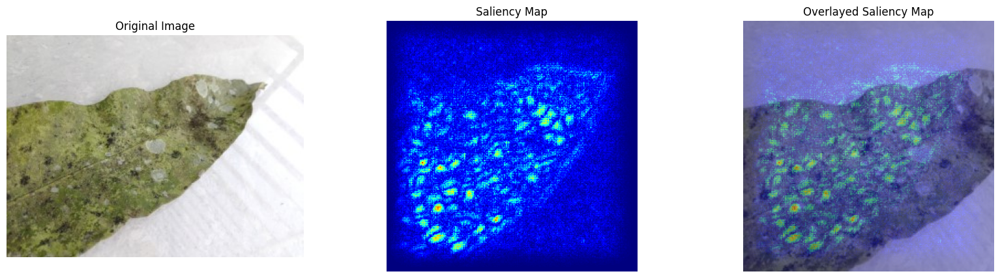

1/1 [==============================] - 0s 23ms/step
Predicted class index: 6, Predicted class label: Powdery Mildew
Saliency map (gradient) values range: 0.0 to 1.9910488845198415e-05


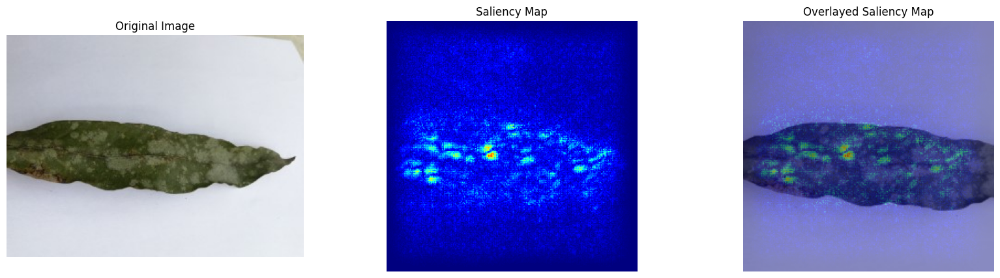

1/1 [==============================] - 0s 21ms/step
Predicted class index: 4, Predicted class label: Gall Midge
Saliency map (gradient) values range: 0.0 to 3.733531411853619e-05


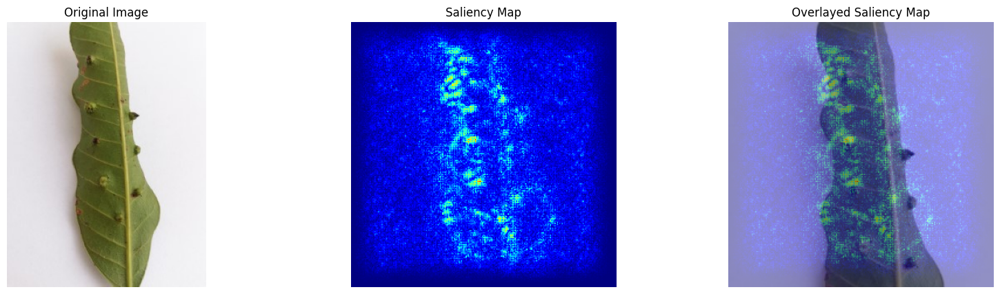

1/1 [==============================] - 0s 24ms/step
Predicted class index: 7, Predicted class label: Sooty Mould
Saliency map (gradient) values range: 0.0 to 0.0003553556161932647


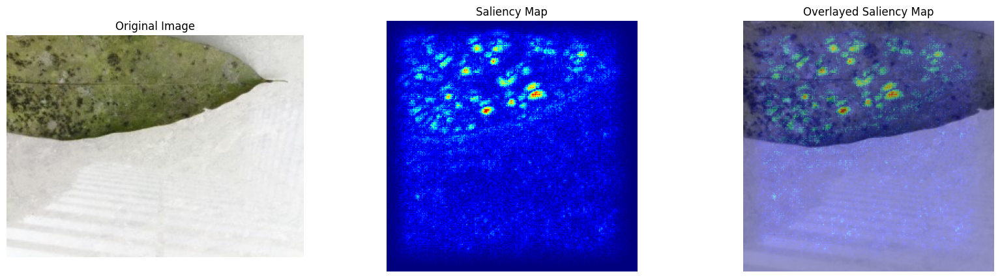

1/1 [==============================] - 0s 30ms/step
Predicted class index: 4, Predicted class label: Gall Midge
Saliency map (gradient) values range: 0.0 to 0.0001054733875207603


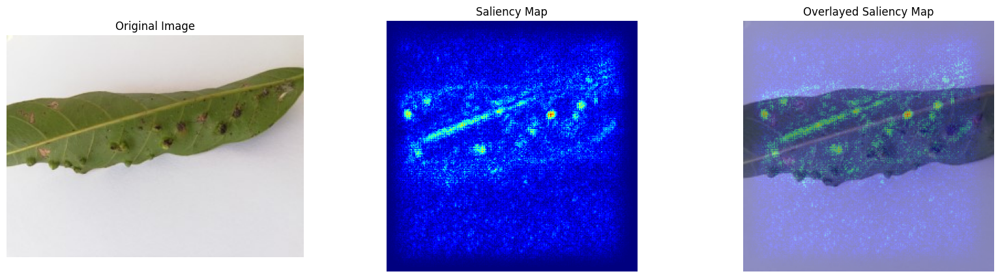

1/1 [==============================] - 0s 20ms/step
Predicted class index: 7, Predicted class label: Sooty Mould
Saliency map (gradient) values range: 0.0 to 0.0005517101963050663


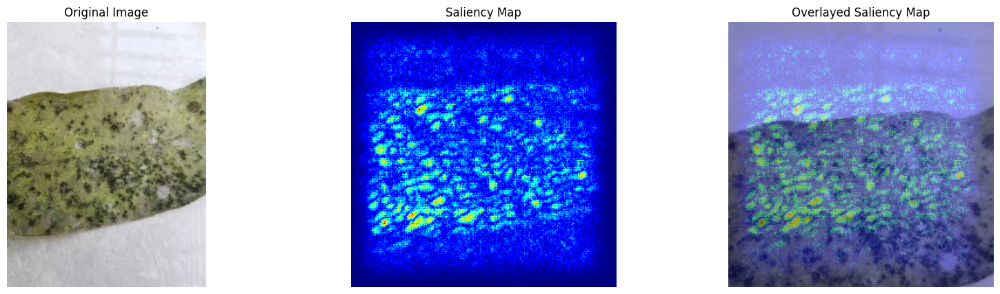

1/1 [==============================] - 0s 30ms/step
Predicted class index: 2, Predicted class label: Cutting Weevil
Saliency map (gradient) values range: 0.0 to 0.0001663147850194946


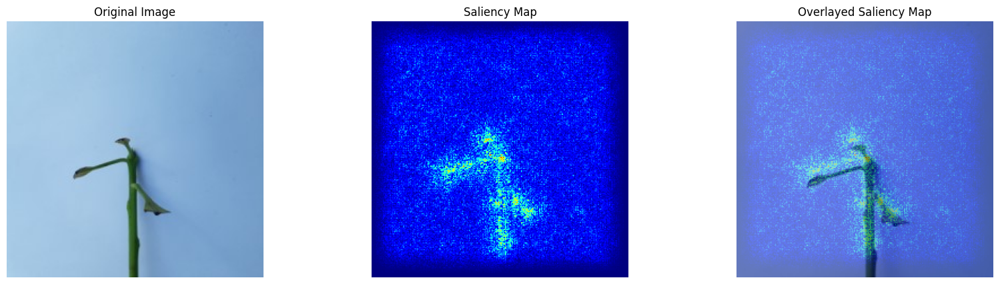

1/1 [==============================] - 0s 22ms/step
Predicted class index: 5, Predicted class label: Healthy
Saliency map (gradient) values range: 0.0 to 1.2922574569529388e-05


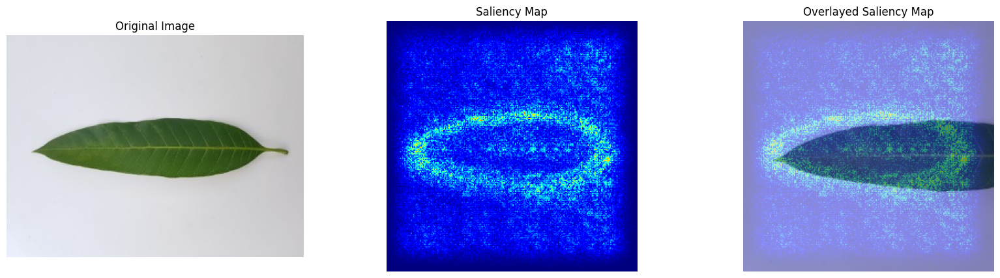

1/1 [==============================] - 0s 23ms/step
Predicted class index: 3, Predicted class label: Die Back
Saliency map (gradient) values range: 0.0 to 3.810122507275082e-05


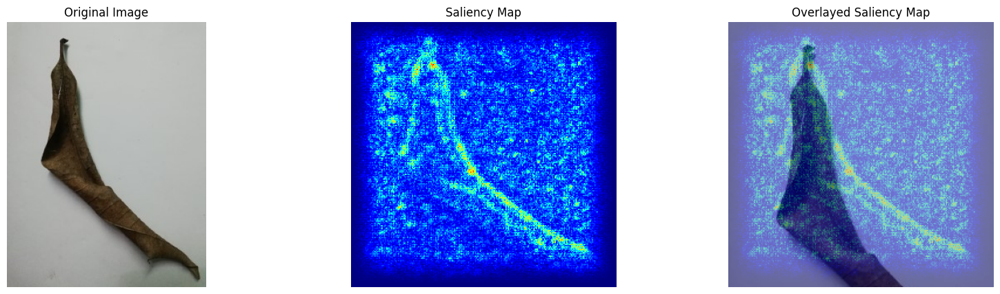

In [34]:
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt
import os

#Preprocessing function
def preprocess_input(image):
    return tf.keras.applications.densenet.preprocess_input(image)

#Image array with preprocessing
def get_img_array(img_path, size):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return preprocess_input(array)

#Saliency Map
def compute_saliency_map(model, img_array, class_index):
    img_tensor = tf.convert_to_tensor(img_array, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(img_tensor)
        preds = model(img_tensor)
        loss = preds[:, class_index]
    grads = tape.gradient(loss, img_tensor)

    saliency = tf.reduce_max(tf.abs(grads), axis=-1)
    
    return saliency[0].numpy()

#Display and Save Saliency Maps
def display_saliency_maps(img_path, saliency, save_path, alpha=0.4):
    img = tf.keras.preprocessing.image.load_img(img_path)
    img = tf.keras.preprocessing.image.img_to_array(img)
    
    saliency = np.maximum(saliency, 0)
    saliency = saliency / saliency.max()
    
    plt.figure(figsize=(20, 5))
    
    #Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(img.astype(np.uint8))
    plt.title("Original Image")
    plt.axis('off')
    
    #Saliency Map
    plt.subplot(1, 3, 2)
    plt.imshow(saliency, cmap='jet')
    plt.title("Saliency Map")
    plt.axis('off')
    
    #Overlayed Saliency Map
    plt.subplot(1, 3, 3)
    plt.imshow(img.astype(np.uint8))
    plt.imshow(saliency, cmap='jet', alpha=alpha)
    plt.title("Overlayed Saliency Map")
    plt.axis('off')
    
    plt.savefig(save_path, format='pdf', bbox_inches='tight')
    plt.show()

#Apply Saliency Map to multiple images
for idx, img_path in enumerate(test_gen.filepaths[:10]):  
    img_array = get_img_array(img_path, size=(227, 227))
    preds = model.predict(img_array)
    class_index = np.argmax(preds[0])
    
    #Predicted class
    print(f'Predicted class index: {class_index}, Predicted class label: {classes[class_index]}')
    
    saliency = compute_saliency_map(model, img_array, class_index)
    
    #Gradient values
    print(f'Saliency map (gradient) values range: {saliency.min()} to {saliency.max()}')
    
    #Save path
    save_path = f"H:/LC25000/Trained Image/PlantLeafNetSaliency_{idx+1}.pdf"
    
    #Display and save the saliency maps
    display_saliency_maps(img_path, saliency, save_path)
